# The purpose of this is to provide a time-series forecast model to predict if the number of positives a country/territory will receive within the next number of days will increase or decrease

> data from: https://www.ecdc.europa.eu/en/publications-data/download-todays-data-geographic-distribution-covid-19-cases-worldwide

In [1]:
# Import custom Time_Series python library and other imports
%run ./utils.ipynb
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from math import sqrt
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 16})
from keras.models import Sequential
from keras.layers import LSTM, Dense, Bidirectional, TimeDistributed, GRU
from keras.optimizers import Adam
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C

## Set start and end dates for train and test sets

In [2]:
str_train_start = '01/01/2020'
str_train_end = '11/01/2020'
str_test_start = str_train_end
str_test_end = '12/01/2020'
start_train_date = pd.to_datetime(str_train_start) # start of train data
end_train_date = pd.to_datetime(str_train_end) # end of train data
start_test_date = pd.to_datetime(str_test_start) # start of train data
end_test_date = pd.to_datetime(str_test_end) # end of train data
k = 17 # number of n-day components
n = 5 # n in n-day averages

## Define model evaluations

In [3]:
models = {} # trained models
Ps_test = {} # post processed predictions
Ts_test = {} # post processed truths

# MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    aerror = np.zeros(y_true.shape, dtype=float)
    for i in range(y_true.shape[0]):
        if y_true[i] < 1:
            aerror[i] = y_pred[i]
        else:
            aerror[i] = np.abs((y_true[i] - y_pred[i]) / y_true[i])
    return np.mean(aerror)

# Measure how accurately model predicted if cases increase or decrease
def increase_decrease_accuracy(x_true, y_true, y_pred):
    n_correct = 0
    for i in range(y_true.shape[0]):
        if y_true[i] > x_true[i, -1]:
            if y_pred[i] > x_true[i, -1]:
                n_correct += 1
        elif y_true[i] < x_true[i, -1]:
            if y_pred[i] < x_true[i, -1]:
                n_correct += 1
    return n_correct / y_true.shape[0]

# plot and evalute model predictions
def evaluate(model_name, proc, X_test, Y_test, P_Test):
    r2 = r2_score(Y_test, P_Test)
    rmse = sqrt(mean_squared_error(Y_test, P_Test))
    mae = mean_absolute_error(Y_test, P_Test)
    mape = mean_absolute_percentage_error(Y_test, P_Test)
    ida = increase_decrease_accuracy(X_test, Y_test, P_Test)
    plt.scatter(np.log10(P_Test), np.log10(Y_test))
    max_order = int(max(np.log10(Y_test).max(), np.log10(P_Test).max())) + 2
    plt.plot([x for x in range(max_order)], [x for x in range(max_order)], color='green')
    plt.xticks(np.arange(0, max_order, 1))
    plt.yticks(np.arange(0, max_order, 1))
    plt.xlabel(r'log$_{10}$(Predicted)')
    plt.ylabel(r'log$_{10}$(Expected)')
    plt.title(model_name + ' ' + proc.title() + ' ' + r'Forecasts, $r^2$=' + str(round(r2, 4)))
    plt.show()
    print('r2', r2, 'rmse', rmse, 'mae', mae, 'mape', mape, 'ida', ida, '\n\n')

## Read, Mungle, Plot, and Process Data

<ipython-input-1-aeb887b0b419>:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(15,7))
<ipython-input-1-aeb887b0b419>:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(15,7))
<ipython-input-1-aeb887b0b419>:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,

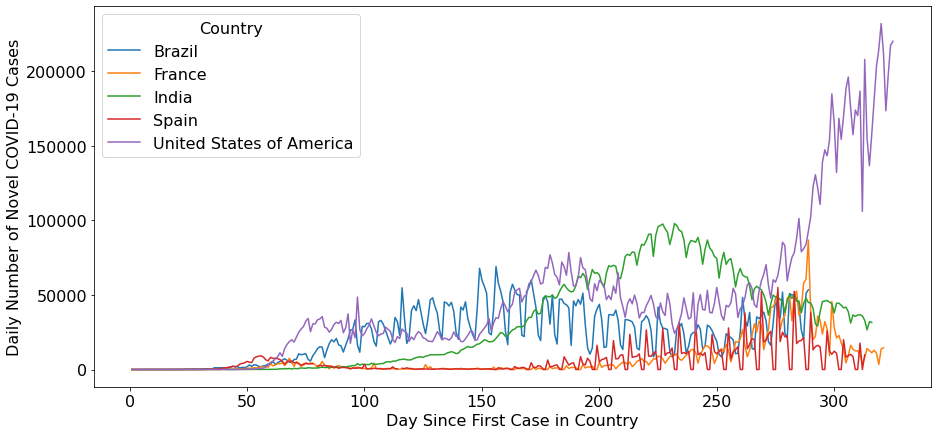

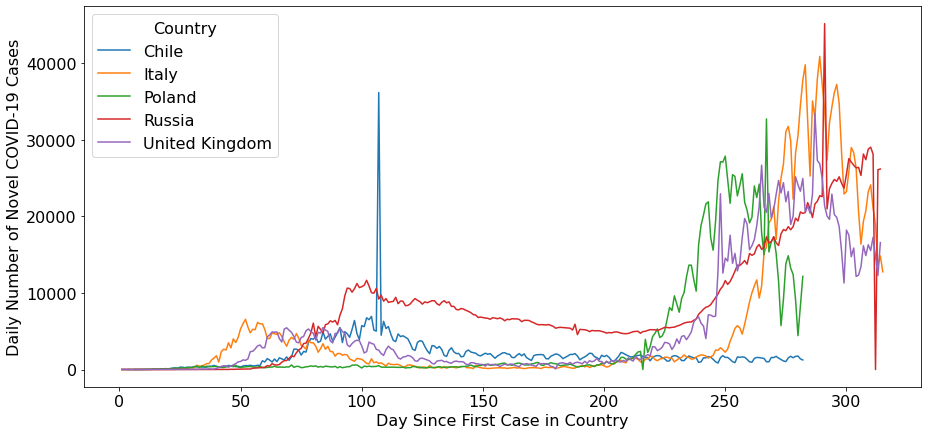

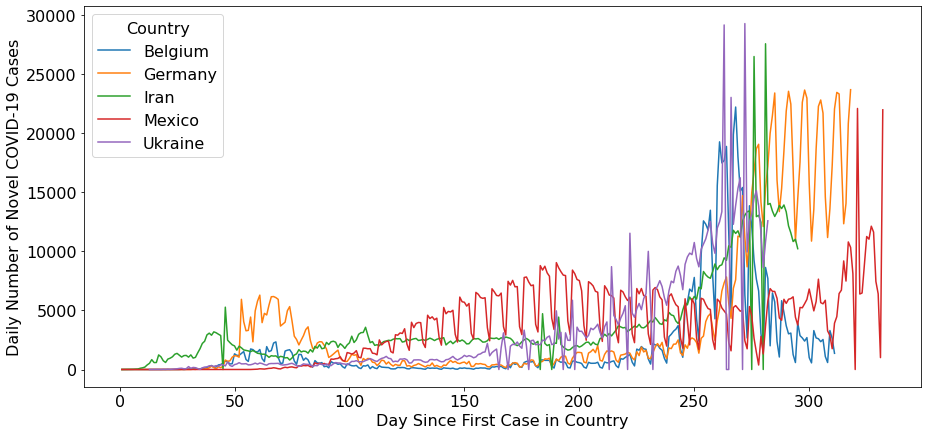

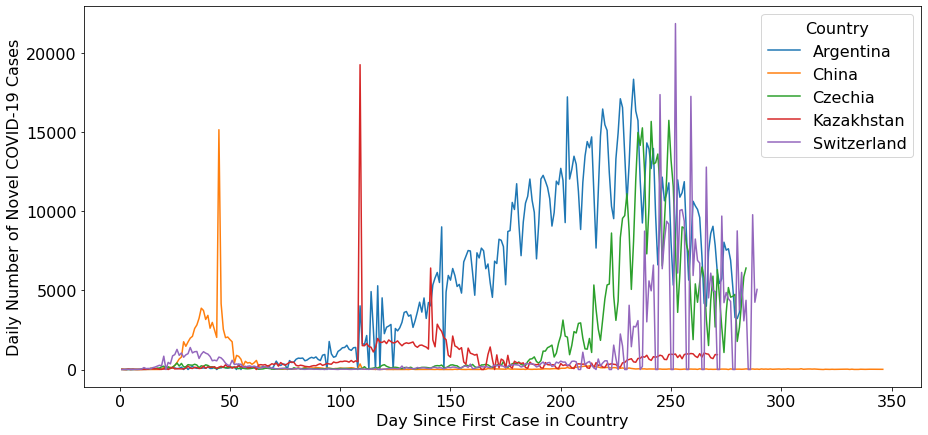

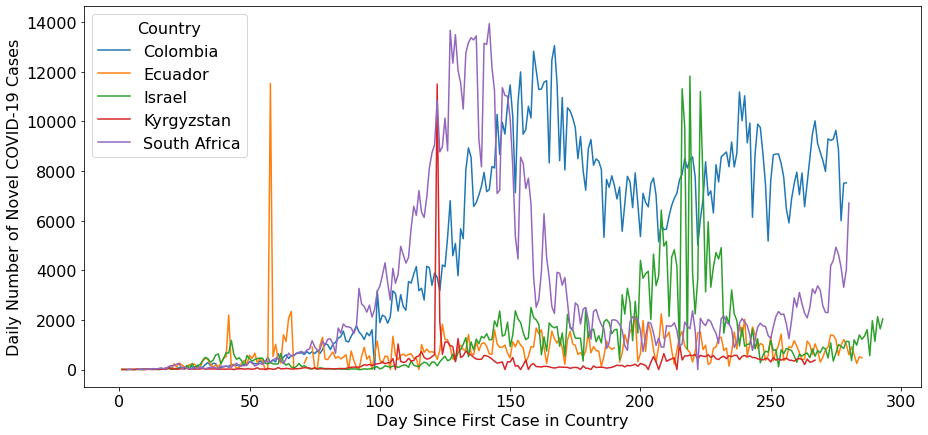

...

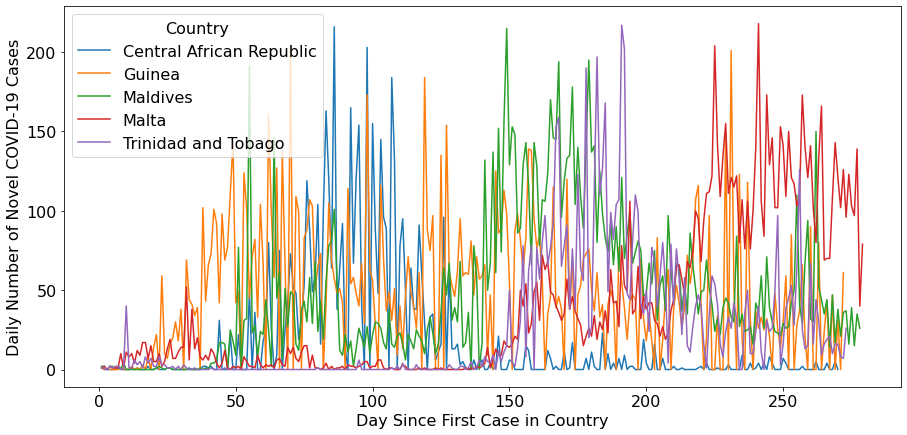

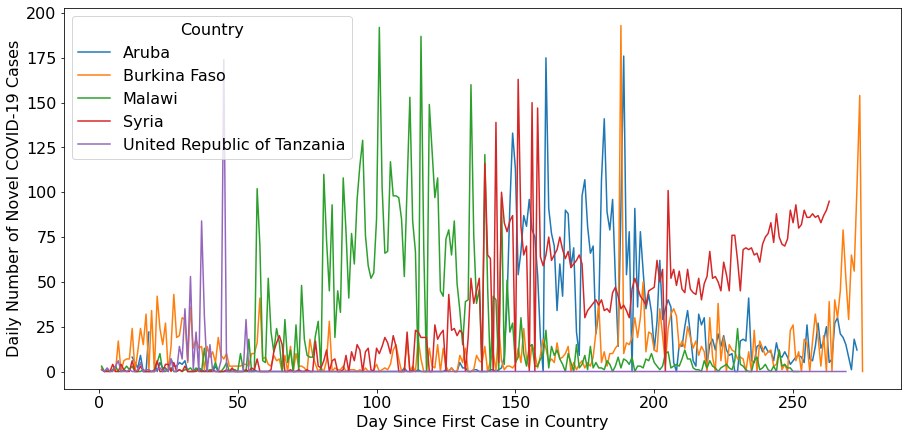

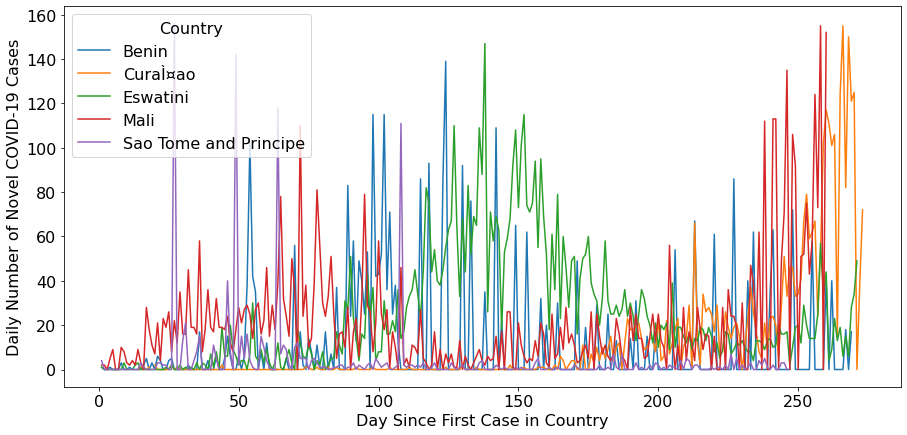

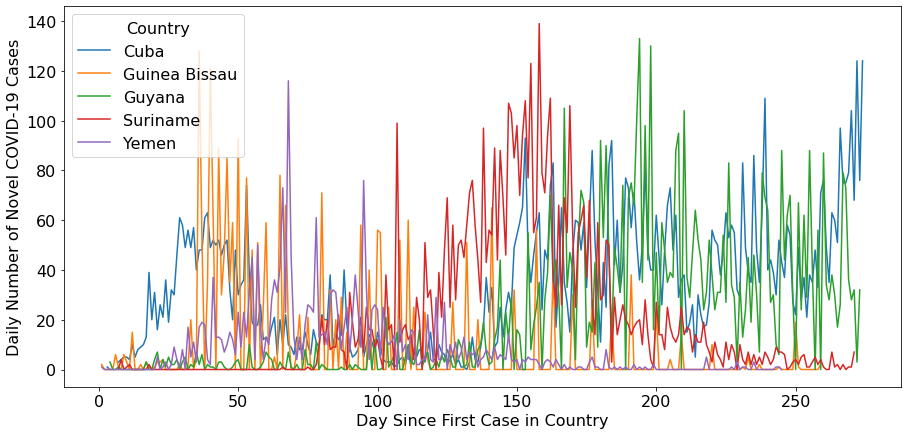

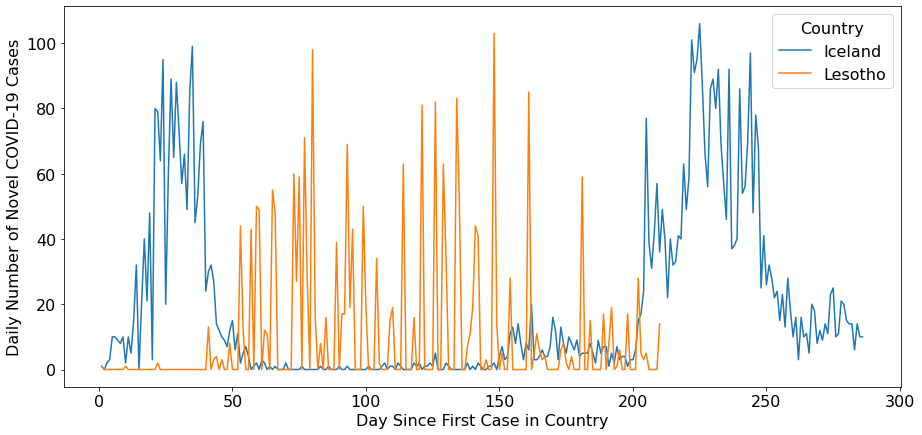

In [4]:
# read data
data = readCOVID19('COVID-19-geographic-disbtribution-worldwide-2020-12-11.csv', days_min=100, cases_min=100)

# plot data
plot5(data)

samples = {}
for_ARIMA = {}
# get trianing data (up to start_date)
samples['train'], for_ARIMA['train_raw'] = prepare_MLA(data, window_size=n, lags=k, sample_name='train'
                            ,outputs=1, label_type='next', deriv=False
                               , start_date=start_train_date, end_date=end_train_date)
# get testing data (between start_date and end_date)
samples['test'], for_ARIMA['test_raw'] = prepare_MLA(data, window_size=n, lags=k, sample_name='test'
                            ,outputs=1, label_type='next', deriv=False
                              , start_date=start_test_date, end_date=end_test_date)

In [5]:
len(list(set(samples['test']['countries'] + samples['train']['countries'])))

151

In [6]:
np.array(samples['test']['Ys'] + samples['train']['Ys']).max()

174667.6

In [5]:
# get X and Y for train and test
Xs_train = {'raw': np.array(samples['train']['Xs'])}
Ys_train = {'raw' : np.array(samples['train']['Ys']).flatten()}
Xs_test = {'raw' : np.array(samples['test']['Xs'])}
Ys_test = {'raw' : np.array(samples['test']['Ys']).flatten()}

# get statistics on train data
X_min = np.min(Xs_train['raw'])
X_max = np.max(Xs_train['raw'])
X_mean = np.mean(Xs_train['raw'])
X_std = np.std(Xs_train['raw'])

# define methods for forward and backward processing
reverses = {}
def preproc(base, name, func):
    Xs_train[name] = func(Xs_train[base])
    Ys_train[name] = func(Ys_train[base])
    Xs_test[name] = func(Xs_test[base])
    Ys_test[name] = func(Ys_test[base])
    for_ARIMA['train_' + name] = {}
    for country in for_ARIMA['train_' + base]:
        for_ARIMA['train_' + name][country] = func(for_ARIMA['train_' + base][country])
    for_ARIMA['test_' + name] = {}
    for country in for_ARIMA['test_' + base]:
        for_ARIMA['test_' + name][country] = func(for_ARIMA['test_' + base][country])

# raw
def reverse_raw(X):
    return X
reverses['raw'] = reverse_raw

# min max normalize between 0 and 1
def norm(X):
    return (X - X_min) / (X_max - X_min)
preproc('raw', 'norm', norm)
def reverse_norm(X):
    return X * (X_max - X_min) + X_min
reverses['norm'] = reverse_norm

# standardize to zero mean and unit variance 
def stand(X):
    return (X - X_mean) / X_std
preproc('raw', 'stand', stand)
def reverse_stand(X):
    return X * X_std + X_mean
reverses['stand'] = reverse_stand
        
# log10 to consider the large range of values
preproc('raw', 'log10', np.log10)
def reverse_log10(X):
    return np.power(10, X)
reverses['log10'] = reverse_log10

# get statistics on ln train data
X_log10_min = np.min(Xs_train['log10'])
X_log10_max = np.max(Xs_train['log10'])
X_log10_mean = np.mean(Xs_train['log10'])
X_log10_std = np.std(Xs_train['log10'])

# take log10 then min max normalize between 0 and 1
def log10_norm(X):
    retX = np.log10(X)
    return (retX - X_log10_min) / (X_log10_max - X_log10_min)
preproc('raw', 'log10_norm', log10_norm)
def reverse_log10_norm(X):
    retX = X * (X_log10_max - X_log10_min) + X_log10_min
    return np.power(10, retX)
reverses['log10_norm'] = reverse_log10_norm

# take log10 then standardize
def log10_stand(X):
    retX = np.log10(X)
    return (retX - X_log10_mean) / X_log10_std
preproc('raw', 'log10_stand', log10_stand)
def reverse_log10_stand(X):
    retX = X * X_log10_std + X_log10_mean
    return np.power(10, retX)
reverses['log10_stand'] = reverse_log10_stand
        
# ln to consider the large range of values
preproc('raw', 'ln', np.log)
def reverse_ln(X):
    return np.exp(X)
reverses['ln'] = reverse_ln

# get statistics on ln train data
X_ln_min = np.min(Xs_train['ln'])
X_ln_max = np.max(Xs_train['ln'])
X_ln_mean = np.mean(Xs_train['ln'])
X_ln_std = np.std(Xs_train['ln'])

# take ln then min max normalize between 0 and 1
def ln_norm(X):
    retX = np.log(X)
    return (retX - X_ln_min) / (X_ln_max - X_ln_min)
preproc('raw', 'ln_norm', ln_norm)
def reverse_ln_norm(X):
    retX = X * (X_ln_max - X_ln_min) + X_ln_min
    return np.exp(retX)
reverses['ln_norm'] = reverse_ln_norm

# take ln then standardize
def ln_stand(X):
    retX = np.log(X)
    return (retX - X_ln_mean) / X_ln_std
preproc('raw', 'ln_stand', ln_stand)
def reverse_ln_stand(X):
    retX = X * X_ln_std + X_ln_mean
    return np.exp(retX)
reverses['ln_stand'] = reverse_ln_stand

# preprare for RNN by casting X and Y in dimensions [N_samples, N_timesteps, N_features]
procs = ['raw', 'norm', 'stand', 'log10', 'log10_norm', 'log10_stand', 'ln', 'ln_norm', 'ln_stand']
for proc in procs:
    Xs_train[proc + '_rnn'] = np.expand_dims(Xs_train[proc], axis=2)
    Ys_train[proc + '_rnn'] = np.expand_dims(np.expand_dims(Ys_train[proc], axis=1), axis=2)
    Xs_test[proc + '_rnn'] = np.expand_dims(Xs_test[proc], axis=2)
    Ys_test[proc + '_rnn'] = np.expand_dims(np.expand_dims(Ys_test[proc], axis=1), axis=2)

# post_process model predictions by undoing processing and removing <1 values
def post_process(X, Y, P, proc):
    P = reverses[proc](P)
    drop_rows = [r for r in range(P.shape[0]) if P[r] <= 1]
    return np.delete(X, drop_rows, axis=0), np.delete(Y, drop_rows, axis=0), np.delete(P, drop_rows, axis=0)

In [17]:
cases_all_log10.max()

5

<ipython-input-21-6158cfc9026a>:1: RuntimeWarning: divide by zero encountered in log10
  cases_all_log10 = np.log10(data['Cases'].to_numpy()).astype(int)
<ipython-input-21-6158cfc9026a>:1: RuntimeWarning: invalid value encountered in log10
  cases_all_log10 = np.log10(data['Cases'].to_numpy()).astype(int)


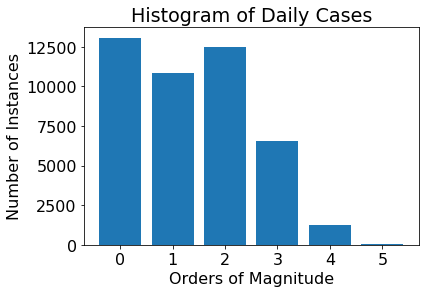

[13081, 10825, 12525, 6533, 1275, 37]


In [21]:
cases_all_log10 = np.log10(data['Cases'].to_numpy()).astype(int)
cases_all_log10 = cases_all_log10[~np.isnan(cases_all_log10)]
cases_all_log10[cases_all_log10 < 1] = 0
histo_all = [0] * (cases_all_log10.max()+1)
for r in range(cases_all_log10.shape[0]):
    histo_all[cases_all_log10[r]] += 1
plt.bar([_ for _ in range(cases_all_log10.max()+1)], histo_all)
plt.xticks(np.arange(0, cases_all_log10.max()+1, 1))
plt.xlabel('Orders of Magnitude')
plt.ylabel('Number of Instances')
plt.title('Histogram of Daily Cases')
plt.show()
print(histo_all)

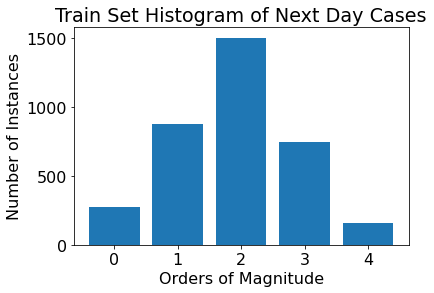

[275, 878, 1504, 749, 159]


In [6]:
Y_train_log10 = np.log10(Ys_train['raw']).astype(int)
histo_train = [0] * (Y_train_log10.max()+1)
for r in range(Y_train_log10.shape[0]):
    histo_train[Y_train_log10[r]] += 1
plt.bar([_ for _ in range(Y_train_log10.max()+1)], histo_train)
plt.xticks(np.arange(0, Y_train_log10.max()+1, 1))
plt.xlabel('Orders of Magnitude')
plt.ylabel('Number of Instances')
plt.title('Train Set Histogram of Next Day Cases')
plt.show()
print(histo_train)

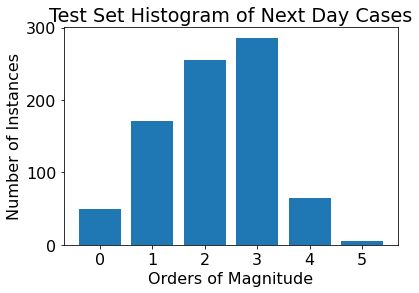

[49, 171, 255, 286, 65, 5]


In [7]:
Y_test_log10 = np.log10(Ys_test['raw']).astype(int)
histo_test = [0] * (Y_test_log10.max()+1)
for r in range(Y_test_log10.shape[0]):
    histo_test[Y_test_log10[r]] += 1
plt.bar([_ for _ in range(Y_test_log10.max()+1)], histo_test)
plt.xticks(np.arange(0, Y_test_log10.max()+1, 1))
plt.xlabel('Orders of Magnitude')
plt.ylabel('Number of Instances')
plt.title('Test Set Histogram of Next Day Cases')
plt.show()
print(histo_test)

## Baseline

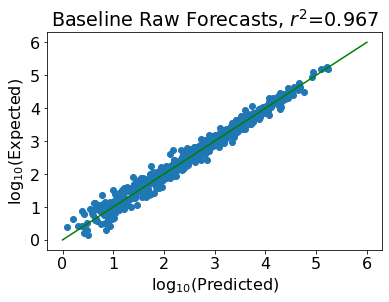

r2 0.9669599033109797 rmse 2545.228920946811 mae 674.249338146811 mape 0.24430485800431048 ida 0.0 




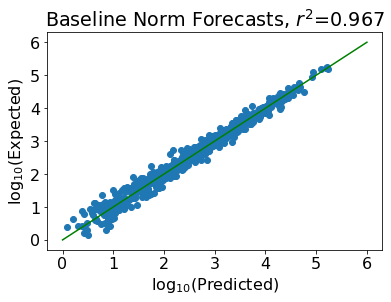

r2 0.9669599033109797 rmse 2545.228920946811 mae 674.249338146811 mape 0.24430485800431048 ida 0.06377858002406739 




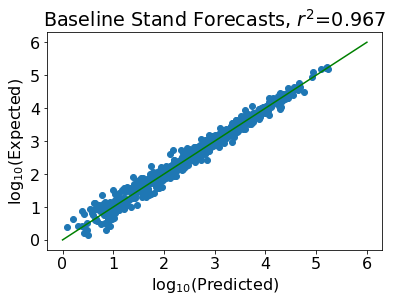

r2 0.9669599033109797 rmse 2545.228920946811 mae 674.249338146811 mape 0.24430485800431023 ida 0.22021660649819494 




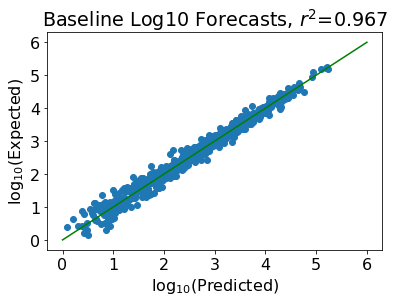

r2 0.9669599033109797 rmse 2545.22892094681 mae 674.249338146811 mape 0.24430485800431048 ida 0.41636582430806257 




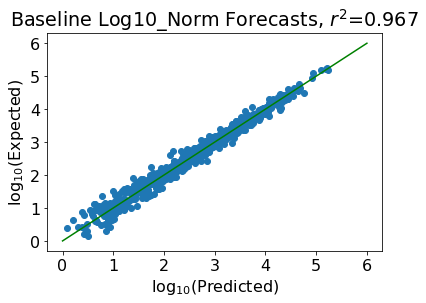

r2 0.9669599033109796 rmse 2545.228920946814 mae 674.2493381468114 mape 0.24430485800431048 ida 0.4332129963898917 




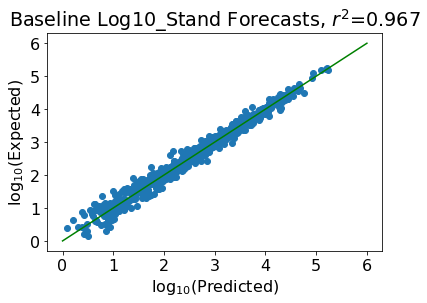

r2 0.9669599033109797 rmse 2545.22892094681 mae 674.249338146811 mape 0.24430485800431048 ida 0.42478941034897716 




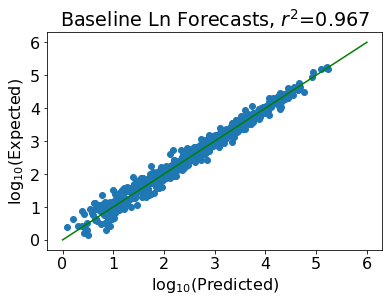

r2 0.9669599033109797 rmse 2545.228920946809 mae 674.2493381468108 mape 0.24430485800431048 ida 0.3910950661853189 




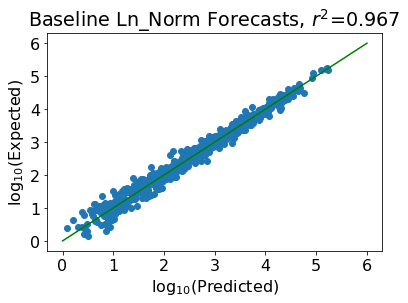

r2 0.9669599033109796 rmse 2545.2289209468136 mae 674.249338146812 mape 0.2443048580043105 ida 0.41636582430806257 




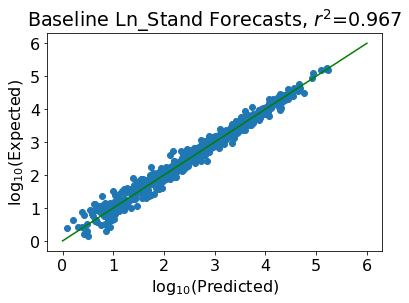

r2 0.9669599033109797 rmse 2545.228920946809 mae 674.2493381468108 mape 0.24430485800431048 ida 0.40673886883273164 




In [8]:
#### make predictions base on previous value
model_name = 'Baseline'
class Baseline:
    def predict(self, X):
        return X[:, -1]

for proc in procs:
    
    # create and train model
    models[proc + '_' + model_name] = Baseline()
    
    # get predictions and post process
    returns = post_process(
        Xs_test['raw']
        , Ys_test['raw']
        , models[proc + '_' + model_name].predict(Xs_test[proc])
        , proc
    )
    Xs_test[proc + '_' + model_name] = returns[0]
    Ts_test[proc + '_' + model_name] = returns[1]
    Ps_test[proc + '_' + model_name] = returns[2]
    
    # evaluate model
    evaluate(
        model_name
        , proc
        , Xs_test[proc + '_' + model_name]
        , Ts_test[proc + '_' + model_name]
        , Ps_test[proc + '_' + model_name]
    )

## Elastic Net

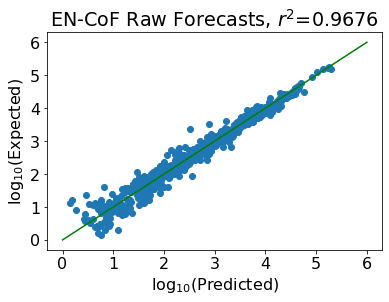

r2 0.9676124792848567 rmse 2536.8590923358333 mae 665.9570643177016 mape 0.29046083527242983 ida 0.645909645909646 




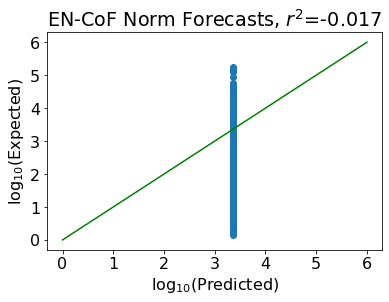

r2 -0.017009626115068066 rmse 14121.106433640067 mae 4412.22345419348 mape 49.61783767833322 ida 0.5499398315282792 




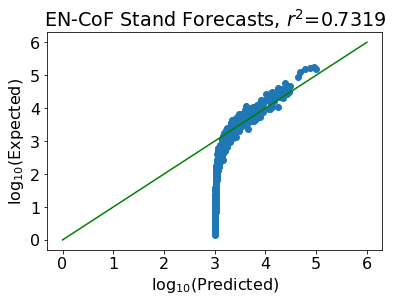

r2 0.7319294542250229 rmse 7249.878759510887 mae 2046.539395896639 mape 22.469358259101615 ida 0.5499398315282792 




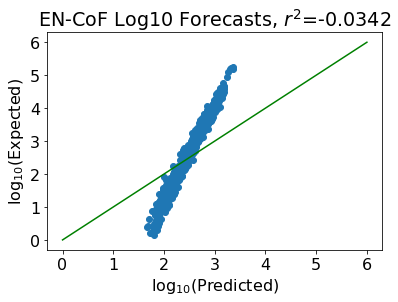

r2 -0.03422114142871546 rmse 14240.095447575413 mae 3729.7217959781165 mape 2.017312409384578 ida 0.48736462093862815 




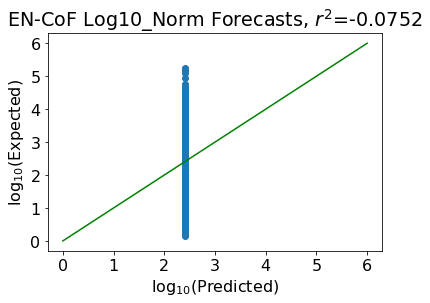

r2 -0.075217499956453 rmse 14519.590122666918 mae 3976.7501916517067 mape 5.699437105154447 ida 0.48736462093862815 




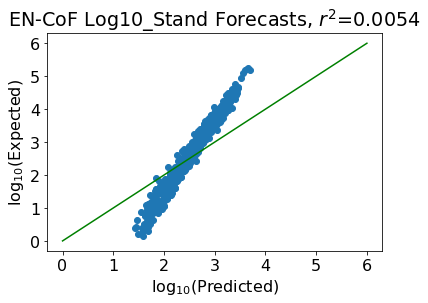

r2 0.005390961351660395 rmse 13964.725245468579 mae 3574.607874678973 mape 1.4537894121194062 ida 0.4897713598074609 




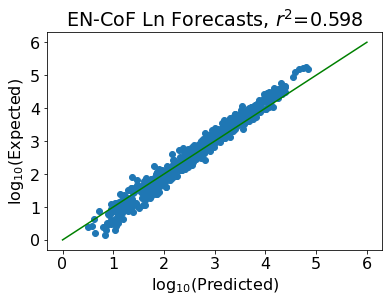

r2 0.5979767950040732 rmse 8878.3396495938 mae 1883.316919255141 mape 0.39380755013817587 ida 0.49338146811071 




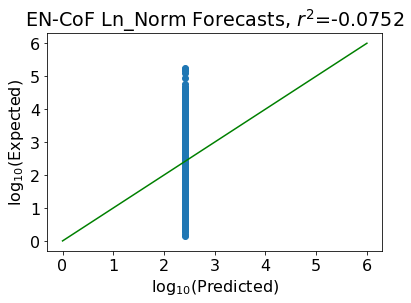

r2 -0.075217499956453 rmse 14519.590122666918 mae 3976.7501916517067 mape 5.699437105154449 ida 0.48736462093862815 




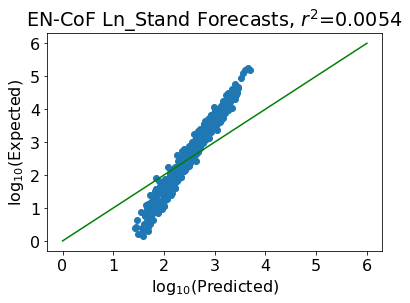

r2 0.005390961351660395 rmse 13964.725245468579 mae 3574.607874678973 mape 1.453789412119406 ida 0.4897713598074609 




In [9]:
#### EN-CoF elastic net linear regression
model_name = 'EN-CoF'

for proc in procs:
    
    # create and train model
    models[proc + '_' + model_name] = ElasticNet(
        fit_intercept = False if proc == 'raw' else True
        , max_iter = 10000
    )
    models[proc + '_' + model_name].fit(Xs_train[proc], Ys_train[proc])
    
    # get predictions and post process
    returns = post_process(
        Xs_test['raw']
        , Ys_test['raw']
        , models[proc + '_' + model_name].predict(Xs_test[proc])
        , proc
    )
    Xs_test[proc + '_' + model_name] = returns[0]
    Ts_test[proc + '_' + model_name] = returns[1]
    Ps_test[proc + '_' + model_name] = returns[2]
    
    # evaluate model
    evaluate(
        model_name
        , proc
        , Xs_test[proc + '_' + model_name]
        , Ts_test[proc + '_' + model_name]
        , Ps_test[proc + '_' + model_name]
    )
        
    #write weights
    weights = models[proc + '_' + model_name].coef_
    with open('Output/' + proc + '_' + model_name + '_weights.csv', 'w', newline='') as file:
        writer = csv.writer(file)
        for r in range(len(weights)):
            writer.writerow([len(weights)-r, weights[r]])
    
# save values in samples for visualizing
temp = models['raw' + '_' + model_name].predict(Xs_test['raw'])
samples['test']['Ps'] = [None] * temp.shape[0]
for r in range(temp.shape[0]):
    samples['test']['Ps'][r] = temp[r]

## Visualize time series and forecasts

<ipython-input-10-6cf3b381fca0>:34: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  raws = data[data['Country'] == country][data['Date'] >= dates[0]]['Cases'].to_numpy()[0:n*len(aves)]
<ipython-input-10-6cf3b381fca0>:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(15,10))


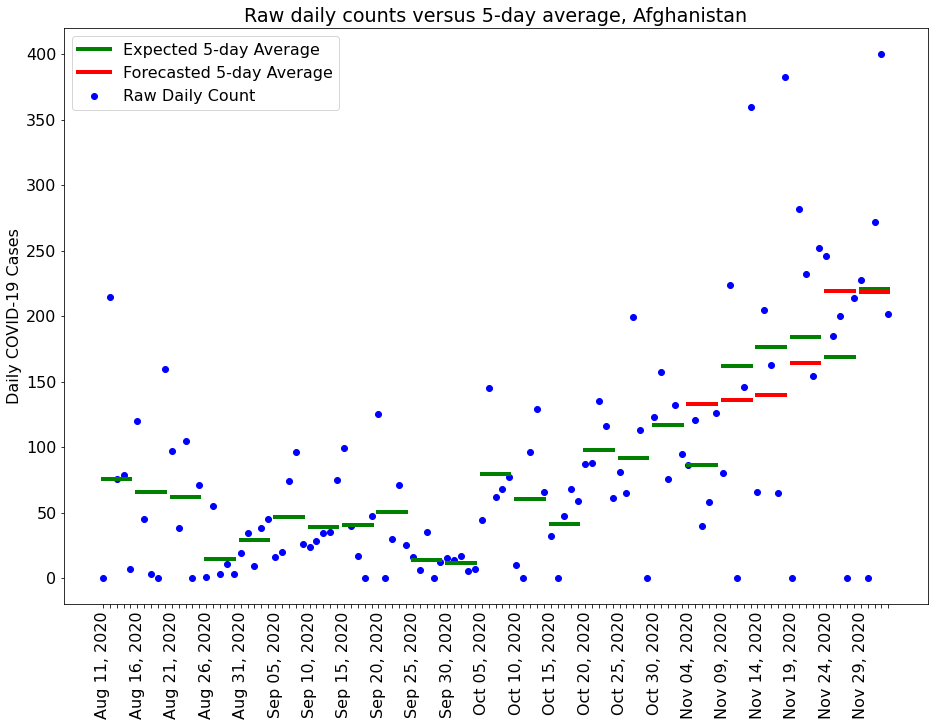

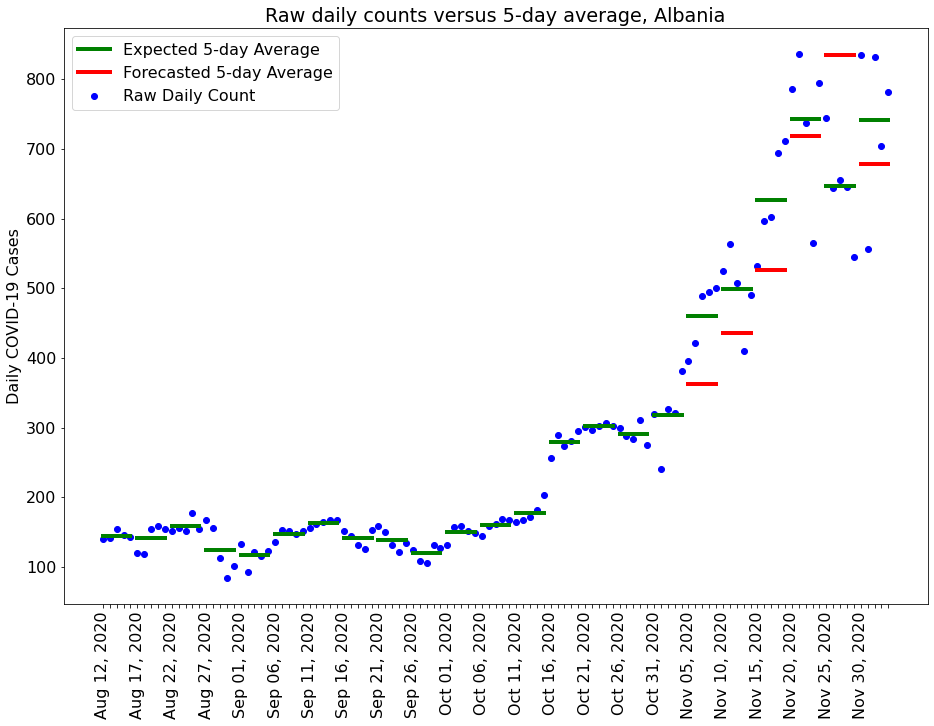

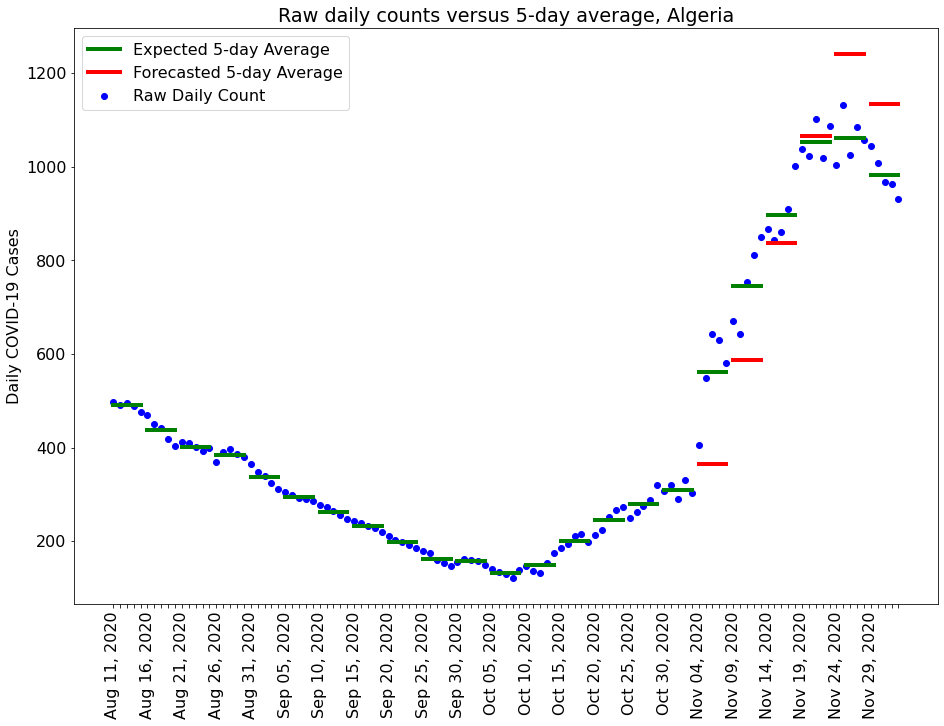

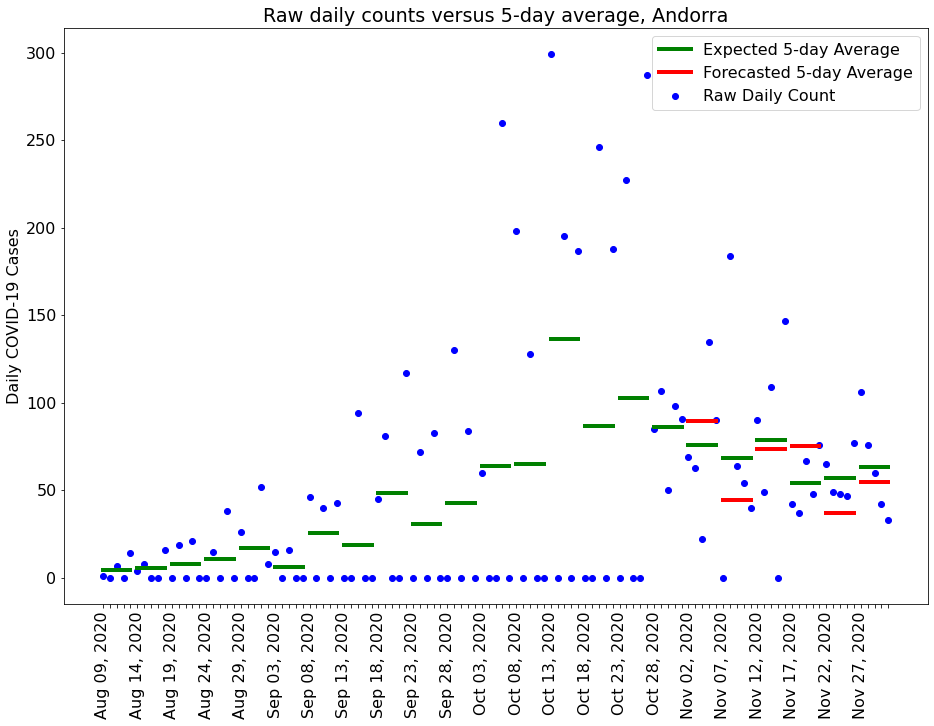

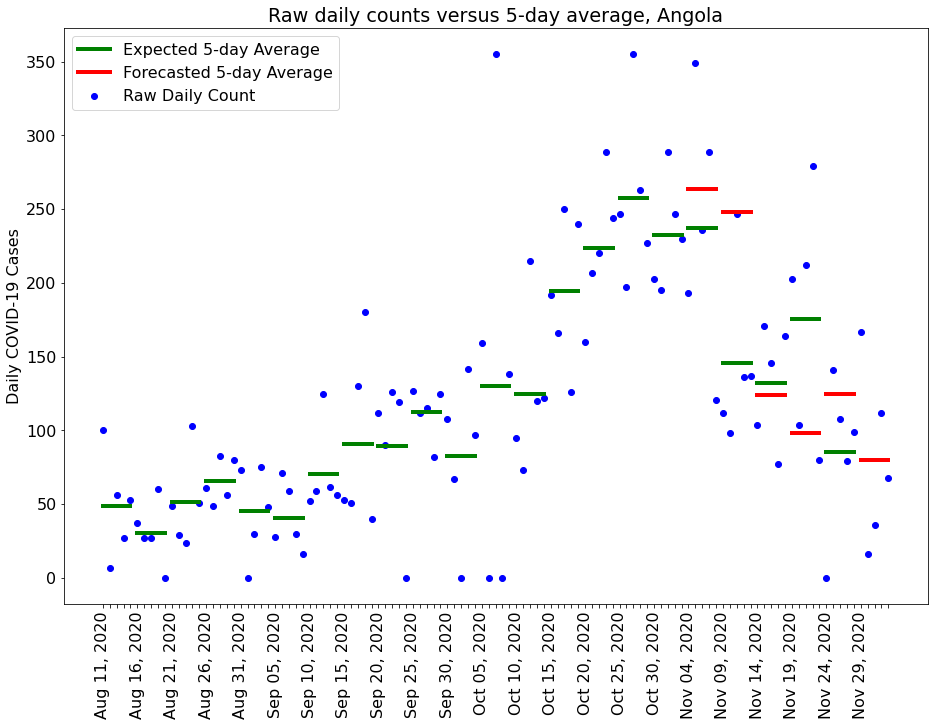

...

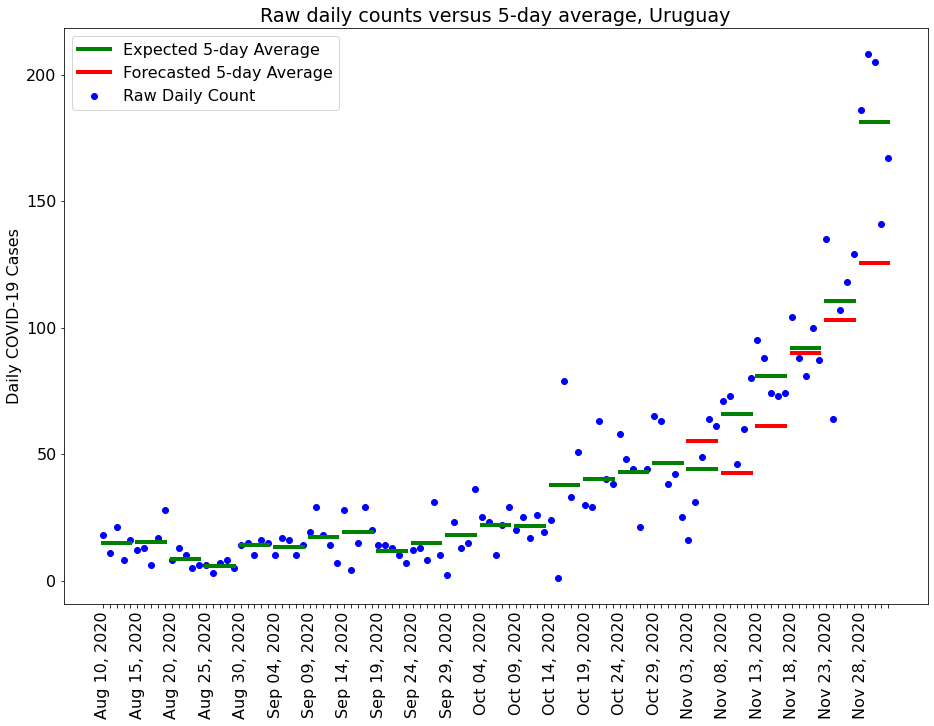

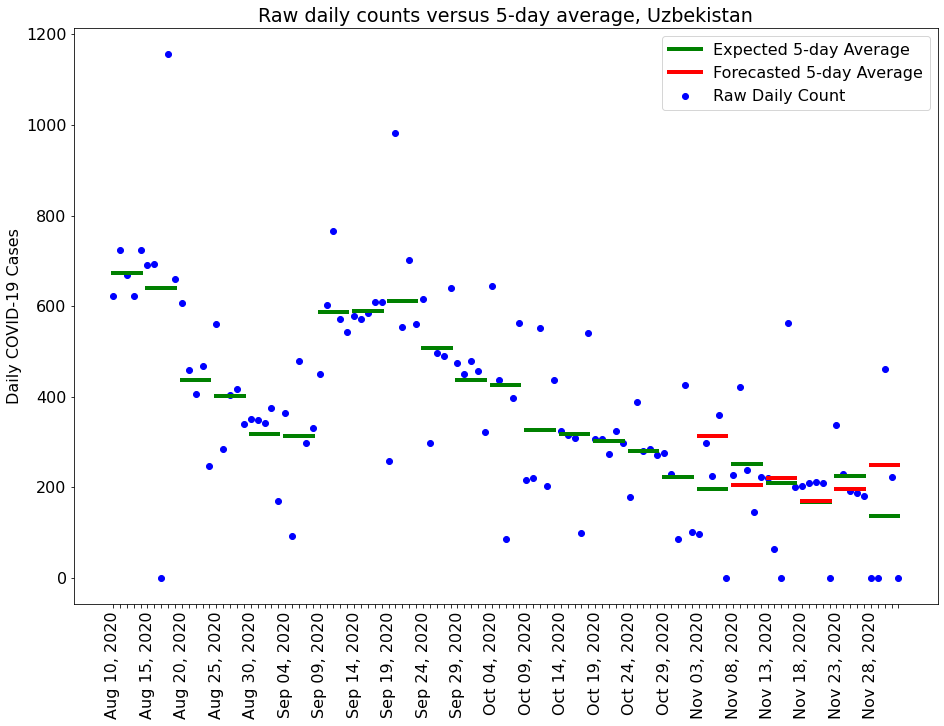

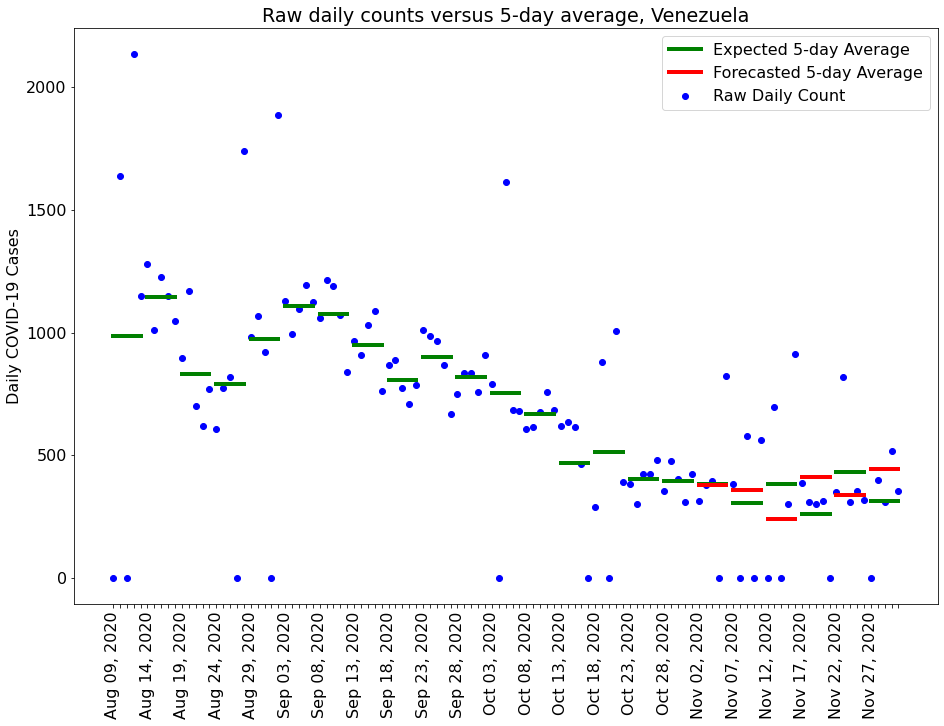

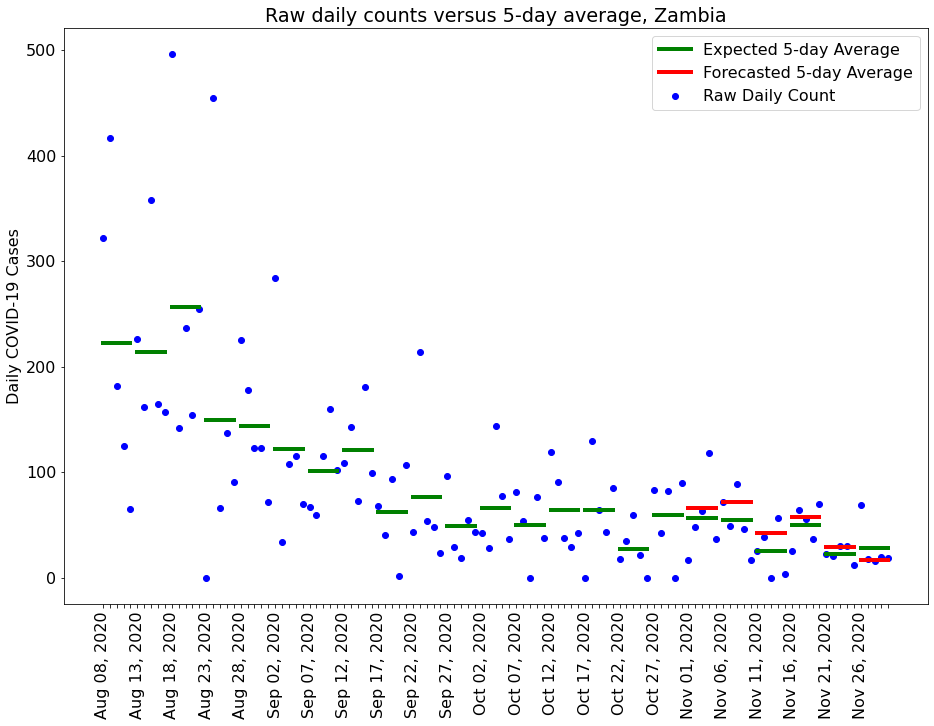

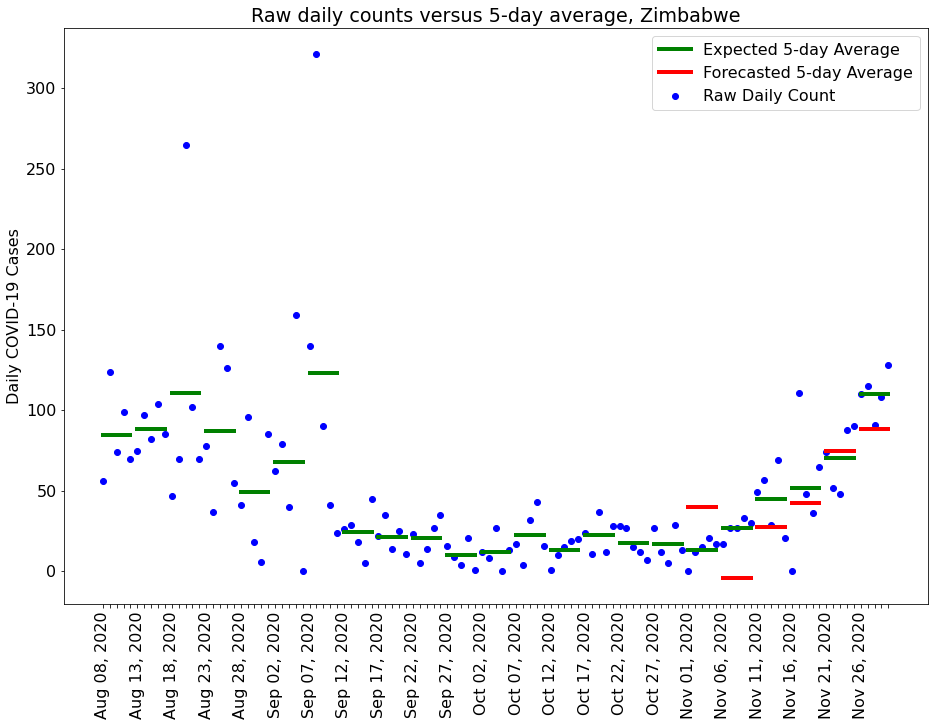

In [10]:
# function used for simple int to month conversion
def convert(s):
    splits = s.split('-')
    year = splits[0]
    month = splits[1]
    day = splits[2]
    if month == '01': month = 'Jan'
    if month == '02': month = 'Feb'
    if month == '03': month = 'Mar'
    if month == '04': month = 'Apr'
    if month == '05': month = 'May'
    if month == '06': month = 'Jun'
    if month == '07': month = 'Jul'
    if month == '08': month = 'Aug'
    if month == '09': month = 'Sep'
    if month == '10': month = 'Oct'
    if month == '11': month = 'Nov'
    if month == '12': month = 'Dec'
    return month + ' ' + day + ', ' + year

# function to plot a country's time series data along with averages and forecasts
def show_country_ts(country, sample, data):
    rs = []
    for idx, c in enumerate(sample['countries']):
        if c == country:
            rs.append(idx)
    aves = sample['Xs'][rs[0]].copy()
    dates = sample['dates'][rs[0]][0:-1].copy()
    preds = []
    for r in rs:
        aves += sample['Ys'][r]
        dates += [sample['dates'][r][-1]]
        preds += [sample['Ps'][r]]
    raws = data[data['Country'] == country][data['Date'] >= dates[0]]['Cases'].to_numpy()[0:n*len(aves)]
    fig = plt.figure(figsize=(15,10))
    axes= fig.add_axes([0.1,0.1,0.8,0.8])
    x = []
    for d in dates:
        x = x + [convert(str(d.strftime('%Y-%m-%d')))] + ['' for _ in range(n-1)] 
    for idx, ave in enumerate(aves):
        if idx == 0:
            axes.plot([_ for _ in range(idx*n, idx*n+n, 1)], [ave for _ in range(n)], color='green', linewidth=4, label='Expected ' + str(n) + '-day Average')
        else:
            axes.plot([_ for _ in range(idx*n, idx*n+n, 1)], [ave for _ in range(n)], color='green', linewidth=4)
    axes.scatter([_ for _ in range(len(raws))], raws, color='blue', label='Raw Daily Count')
    for idx, pred in enumerate(preds):
        if idx == 0:
            axes.plot([_ for _ in range(k*n, k*n+n, 1)], [pred for _ in range(n)], color='red', linewidth=4, label='Forecasted ' + str(n) + '-day Average')
        else:
            axes.plot([_ for _ in range(k*n + idx*n, k*n+n + idx*n, 1)], [pred for _ in range(n)], color='red', linewidth=4)
    axes.legend()#loc='center left', bbox_to_anchor=(1, 0.5))
    plt.xticks([_ for _ in range(len(raws))], x, rotation='vertical')
    plt.ylabel('Daily COVID-19 Cases')
    plt.title('Raw daily counts versus ' + str(n) + '-day average, ' + country)
    
# plot each country time series with forecast
countries = list(set(samples['test']['countries']))
countries.sort()
for country in countries:
    show_country_ts(country, samples['test'], data)

## ARIMA

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


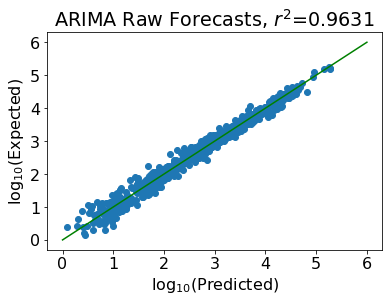

r2 0.9631005656103098 rmse 2714.336750576284 mae 744.3980424819723 mape 0.2568371941487686 ida 0.7680981595092025 




In [11]:
#### ARIMA trained on each country seperately
model_name = 'ARIMA'

for proc in ['raw']:
    
    # now we need to step through each country, and train/evaluate an ARIMA for each
    preds = [] # keep track of forecasts
    truths = [] # keep track of expected values
    for country in for_ARIMA['test_' + proc]: # iterate through all data points
        if country not in for_ARIMA['train_' + proc]:
            continue
        
        # keep track of training and test values
        train_series = np.array(for_ARIMA['train_' + proc][country])
        test_series = np.array(for_ARIMA['test_' + proc][country])
        test_series_raw = np.array(for_ARIMA['test_raw'][country])
        
        # create and fit model
        for i in range(test_series.shape[0]):
            model_ARIMA = SARIMAX(train_series, order=(1, 1, 1))#, enforce_stationarity=False)
            model_ARIMA = model_ARIMA.fit(maxiter=1000)

            # make predictions, add to list
            preds.append(model_ARIMA.forecast(steps=1))
            truths.append(test_series_raw[i])

            # now append test values to predict next days
            train_series = np.append(train_series, test_series[i])
    
    # get predictions and post process
    returns = post_process(
        Xs_test['raw']
        , np.array(truths)
        , np.array(preds)
        , proc
    )
    Xs_test[proc + '_' + model_name] = returns[0]
    Ts_test[proc + '_' + model_name] = returns[1]
    Ps_test[proc + '_' + model_name] = returns[2]
    
    # evaluate model
    evaluate(
        model_name
        , proc
        , Xs_test[proc + '_' + model_name]
        , Ts_test[proc + '_' + model_name]
        , Ps_test[proc + '_' + model_name]
    )

## Bi-LSTM

In [12]:
#### Bi-LSTM taking variable sequence length
model_name = 'Bi-LSTM'

for proc in ['norm']:
    
    # ceate model
    models[proc + '_' + model_name] = Sequential()
    models[proc + '_' + model_name].add(Bidirectional(LSTM(32, return_sequences=True, input_shape=(None, 1))))
    models[proc + '_' + model_name].add(Bidirectional(LSTM(64, return_sequences=True)))
    models[proc + '_' + model_name].add(Bidirectional(LSTM(128)))
    models[proc + '_' + model_name].add(Dense(1))
    # add optimizer
    models[proc + '_' + model_name].compile(loss='mse', optimizer=Adam(learning_rate=0.001), metrics=['mae'])
    # train 
    history = models[proc + '_' + model_name].fit(Xs_train[proc + '_rnn'], Ys_train[proc + '_rnn']
                                                  , epochs=300, batch_size=10, verbose=1)
    
    # get predictions and post process
    returns = post_process(
        Xs_test['raw']
        , Ys_test['raw']
        , models[proc + '_' + model_name].predict(Xs_test[proc + '_rnn']).flatten()
        , proc
    )
    Xs_test[proc + '_' + model_name] = returns[0]
    Ts_test[proc + '_' + model_name] = returns[1]
    Ps_test[proc + '_' + model_name] = returns[2]
    
    # evaluate model
    evaluate(
        model_name
        , proc
        , Xs_test[proc + '_' + model_name]
        , Ts_test[proc + '_' + model_name]
        , Ps_test[proc + '_' + model_name]
    )

    # plot learning curve
    plt.plot(history.history['loss'], label='train')
    plt.ylabel('Mean Squared Error')
    plt.xlabel('Training Epoch')
    plt.title(model_name + ' ' + proc.title() + ' Learning Curve')
    plt.legend()
    plt.show()

Epoch 1/300
357/357 [==============================] - 8s 22ms/step - loss: 0.0022 - mae: 0.0187
Epoch 2/300
357/357 [==============================] - 8s 22ms/step - loss: 6.9324e-04 - mae: 0.0100
Epoch 3/300
357/357 [==============================] - 8s 21ms/step - loss: 5.4222e-04 - mae: 0.0095
Epoch 4/300
357/357 [==============================] - 7s 21ms/step - loss: 3.6847e-04 - mae: 0.0070
Epoch 5/300
357/357 [==============================] - 7s 21ms/step - loss: 3.5350e-04 - mae: 0.0072
Epoch 6/300
357/357 [==============================] - 8s 21ms/step - loss: 9.9803e-04 - mae: 0.0113
Epoch 7/300
357/357 [==============================] - 8s 22ms/step - loss: 2.7257e-04 - mae: 0.0062
Epoch 8/300
357/357 [==============================] - 8s 22ms/step - loss: 2.8049e-04 - mae: 0.0066
Epoch 9/300
357/357 [==============================] - 8s 21ms/step - loss: 2.7908e-04 - mae: 0.0061
Epoch 10/300
357/357 [==============================] - 7s 21ms/step - loss: 2.6969e-04 - mae: 

KeyboardInterrupt: 

## LSTM

In [ ]:
#### LSTM taking variable sequence length
model_name = 'LSTM'

for proc in ['norm']:
    
    # ceate model
    models[proc + '_' + model_name] = Sequential()
    models[proc + '_' + model_name].add(LSTM(32, return_sequences=True, input_shape=(None, 1)))
    models[proc + '_' + model_name].add(LSTM(64, return_sequences=True))
    models[proc + '_' + model_name].add(LSTM(128))
    models[proc + '_' + model_name].add(Dense(1))
    # add optimizer
    models[proc + '_' + model_name].compile(loss='mse', optimizer=Adam(learning_rate=0.001), metrics=['mae'])
    models[proc + '_' + model_name].summary()
    # train 
    history = models[proc + '_' + model_name].fit(Xs_train[proc + '_rnn'], Ys_train[proc + '_rnn']
                                                  , epochs=300, batch_size=10, verbose=1)
    
    # get predictions and post process
    returns = post_process(
        Xs_test['raw']
        , Ys_test['raw']
        , models[proc + '_' + model_name].predict(Xs_test[proc + '_rnn']).flatten()
        , proc
    )
    Xs_test[proc + '_' + model_name] = returns[0]
    Ts_test[proc + '_' + model_name] = returns[1]
    Ps_test[proc + '_' + model_name] = returns[2]
    
    # evaluate model
    evaluate(
        model_name
        , proc
        , Xs_test[proc + '_' + model_name]
        , Ts_test[proc + '_' + model_name]
        , Ps_test[proc + '_' + model_name]
    )

    # plot learning curve
    plt.plot(history.history['loss'], label='train')
    plt.ylabel('Mean Squared Error')
    plt.xlabel('Training Epoch')
    plt.title(model_name + ' ' + proc.title() + ' Learning Curve')
    plt.legend()
    plt.show()

## GRU

In [ ]:
#### GRU taking variable sequence length
model_name = 'GRU'

for proc in ['norm']:
    
    # ceate model
    models[proc + '_' + model_name] = Sequential()
    models[proc + '_' + model_name].add(GRU(32, return_sequences=True, input_shape=(None, 1)))
    models[proc + '_' + model_name].add(GRU(64, return_sequences=True))
    models[proc + '_' + model_name].add(GRU(128))
    models[proc + '_' + model_name].add(Dense(1))
    # add optimizer
    models[proc + '_' + model_name].compile(loss='mse', optimizer=Adam(learning_rate=0.001), metrics=['mae'])
    # train 
    history = models[proc + '_' + model_name].fit(Xs_train[proc + '_rnn'], Ys_train[proc + '_rnn']
                                                  , epochs=300, batch_size=10, verbose=1)
    
    # get predictions and post process
    returns = post_process(
        Xs_test['raw']
        , Ys_test['raw']
        , models[proc + '_' + model_name].predict(Xs_test[proc + '_rnn']).flatten()
        , proc
    )
    Xs_test[proc + '_' + model_name] = returns[0]
    Ts_test[proc + '_' + model_name] = returns[1]
    Ps_test[proc + '_' + model_name] = returns[2]
    
    # evaluate model
    evaluate(
        model_name
        , proc
        , Xs_test[proc + '_' + model_name]
        , Ts_test[proc + '_' + model_name]
        , Ps_test[proc + '_' + model_name]
    )

    # plot learning curve
    plt.plot(history.history['loss'], label='train')
    plt.ylabel('Mean Squared Error')
    plt.xlabel('Training Epoch')
    plt.title(model_name + ' ' + proc.title() + ' Learning Curve')
    plt.legend()
    plt.show()

# GPR

In [ ]:
#### Gaussian Process Regression, outputs uncertainty
model_name = 'GPR'

for proc in ['stand']:
    
    # Instantiate a Gaussian Process model
    kernel = C(1.0, (1e-3, 1e3)) * RBF(10, (1e-2, 1e2))
    models[proc + '_' + model_name] = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=9)
    # Fit to data using Maximum Likelihood Estimation of the parameters
    models[proc + '_' + model_name].fit(Xs_train[proc], Ys_train[proc])
    
    # get predictions and post process
    returns = post_process(
        Xs_test['raw']
        , Ys_test['raw']
        , models[proc + '_' + model_name].predict(Xs_test[proc])
        , proc
    )
    Xs_test[proc + '_' + model_name] = returns[0]
    Ts_test[proc + '_' + model_name] = returns[1]
    Ps_test[proc + '_' + model_name] = returns[2]
    
    # evaluate model
    evaluate(
        model_name
        , proc
        , Xs_test[proc + '_' + model_name]
        , Ts_test[proc + '_' + model_name]
        , Ps_test[proc + '_' + model_name]
    )

In [ ]:
from pickle import load, dump
pickle.dump(Xs_test, open('Output/Xs_test', 'wb'))
pickle.dump(Ts_test, open('Output/Ts_test', 'wb'))
pickle.dump(Ps_test, open('Output/Ps_test', 'wb'))
pickle.dump(models, open('Output/models', 'wb'))